In [17]:
 import json
import matplotlib as plt
import csv
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from decimal import Decimal
import seaborn as sns 
import pandas as pd
import networkx as nx
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
import operator
import numpy as np
import random

In [18]:
import seaborn
seaborn_colors=[]
for k in seaborn.xkcd_rgb.keys():
    seaborn_colors.append(k)

In [19]:
import csv
#csvData=[['data','x','y','type']]
csvData=[]
count=0
#filename = "G:/Thesis/Dropclust/plots/output_normalized_own_cc.csv"
#filename = "G:/Thesis/Dropclust/plots/PCA_GENES/output_normalized_own_cc.csv"
#filename = "G:/Thesis/Dropclust/output_normalized_zscore_cc1.csv"
#filename = "C:/Users/Swagatam/IdeaProjects/openOrd/output_normalized_own_cc.csv"
filename = "G:/Thesis/Dropclust/Code/output_3k/output_normalized_own_cc.csv"
coord_data = pd.read_csv(filename,names=['data','x','y'])
coord_data.set_index('data',inplace=True)
data=[]
data_outlier=[]
with open(filename, 'r') as csvfile:
     csvreader = csv.reader(csvfile)
     for row in csvreader:
        #f=0
         #row=[float(i) for i in row]
        data.append(row)
        temp_outlier=[]
        temp_outlier.append(row[1])
        temp_outlier.append(row[2])
        data_outlier.append(temp_outlier)
        temp=row
        #if row[0].isnumeric():
        #    temp.append('cell')
        if len(row[0]) ==16:
            temp.append('cell')
        else:
            temp.append('gene')
            count=count+1
        csvData.append(temp)

# DB SCAN

In [20]:
noise =[]
db = DBSCAN(eps=35,min_samples=15).fit_predict(data_outlier)
final_data=[]
csvData=[['data','x','y','type']]
for i in range(0,len(list(db))):
    if db[i]!=-1:
        final_data.append(data[i])
        csvData.append(data[i])
    if db[i]==-1:
        noise.append(data[i][0])
data=final_data
print(len(csvData))
n_clusters = len(set(db)) - (1 if -1 in list(db) else 0)
print(n_clusters)

1645
8


C:\Users\Swagatam\Anaconda3\lib\site-packages\sklearn\utils\validation.py:532: FutureWarning: Beginning in version 0.22, arrays of bytes/strings will be converted to decimal numbers if dtype='numeric'. It is recommended that you convert the array to a float dtype before using it in scikit-learn, for example by using your_array = your_array.astype(np.float64).
  FutureWarning)
C:\Users\Swagatam\Anaconda3\lib\site-packages\sklearn\utils\validation.py:532: FutureWarning: Beginning in version 0.22, arrays of bytes/strings will be converted to decimal numbers if dtype='numeric'. It is recommended that you convert the array to a float dtype before using it in scikit-learn, for example by using your_array = your_array.astype(np.float64).
  FutureWarning)
C:\Users\Swagatam\Anaconda3\lib\site-packages\sklearn\utils\validation.py:532: FutureWarning: Beginning in version 0.22, arrays of bytes/strings will be converted to decimal numbers if dtype='numeric'. It is recommended that you convert the a

In [13]:
db1=list(db)
db1.count(-1)

407

# OUTLIER VISUALIZATION

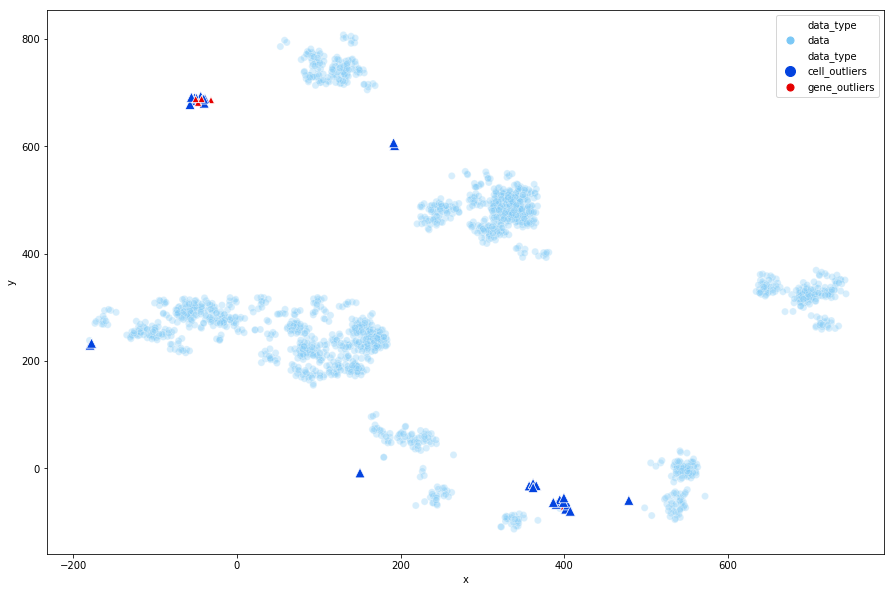

In [21]:
data_type = []
c=0
g=0
for i in range(0,len(coord_data)):
    if db[i]!=-1:
        data_type.append("data")
    else:
        if len(coord_data.index[i])==16:
            data_type.append("cell_outliers")
        else:
            data_type.append("gene_outliers")
coord_data["data_type"] = data_type
data_colors = ["lightblue"]
noise_colors = ['blue','red']
coord_data["alpha"] = np.where(coord_data['data_type'] == 'data', 0.5,1.0)
plt.figure(figsize=(15,10))
ax = sns.scatterplot(x="x", y="y", data=coord_data[coord_data['alpha']==0.5],hue="data_type",palette=sns.xkcd_palette(data_colors),sizes=(50,100),size="data_type",alpha=0.3)
sns.scatterplot(x="x", y="y", data=coord_data[coord_data['alpha']==1.0],hue="data_type",palette=sns.xkcd_palette(noise_colors),sizes=(50,100),size="data_type",marker="^",alpha=1.0,ax=ax)

# POST-HOC CLUSTER ASSIGNMENT

In [23]:
neighbor_df = pd.read_csv('G:/Thesis/Dropclust/Code/output_3k/neighbor.csv')
neighbor_df.set_index('Unnamed: 0',inplace=True)
col = list(neighbor_df.columns)
index = list(neighbor_df.index)
cell_dict = dict()
column_dict = dict()
for i in range(len(col)):
    column_dict[i]=col[i]
for i in range(len(list(neighbor_df.index))):
    row = neighbor_df.iloc[i]
    col_ind = list(row.to_numpy().nonzero())[0]
    for ind in col_ind:
        if index[i] in cell_dict.keys():
            cell_dict[index[i]].append(column_dict[ind])
        else:
            temp=[]
            temp.append(column_dict[ind])
            cell_dict[index[i]]=temp
cluster_assign = []
for key_cell in cell_dict.keys():
    clust = dict()
    cells = cell_dict[key_cell]
    for cell in cells:
        cluster = db[list(coord_data.index).index(cell)]
        if cluster not in clust.keys():
            clust[cluster]=1
        else:
            clust[cluster]=clust[cluster]+1
    max_cluster=max(clust.items(), key=operator.itemgetter(1))[0]
    if max_cluster == -1:
        continue
    cluster_assign.append(max_cluster)
    x_total = 0
    y_total = 0
    count = 0
    for cell in cells:
        if db[list(coord_data.index).index(cell)] == max_cluster:
            count=count+1
            x_total=x_total+coord_data.loc[cell]['x']
            y_total=y_total+coord_data.loc[cell]['y']
    temp=[]
    temp.append(key_cell)
    temp.append(x_total/count)
    temp.append(y_total/count)
    temp.append('cell')
    csvData.append(temp)

In [24]:
import csv
with open('data.csv', 'w') as csvFile:
    writer = csv.writer(csvFile)
    writer.writerows(csvData)
csvFile.close()
data_df = pd.read_csv("data.csv",delimiter=",",index_col=False)
clusters_info = [x for x in db if x!=-1]
clusters_info = clusters_info + cluster_assign
data_df['cluster'] = clusters_info
data_df.to_csv('data.csv')

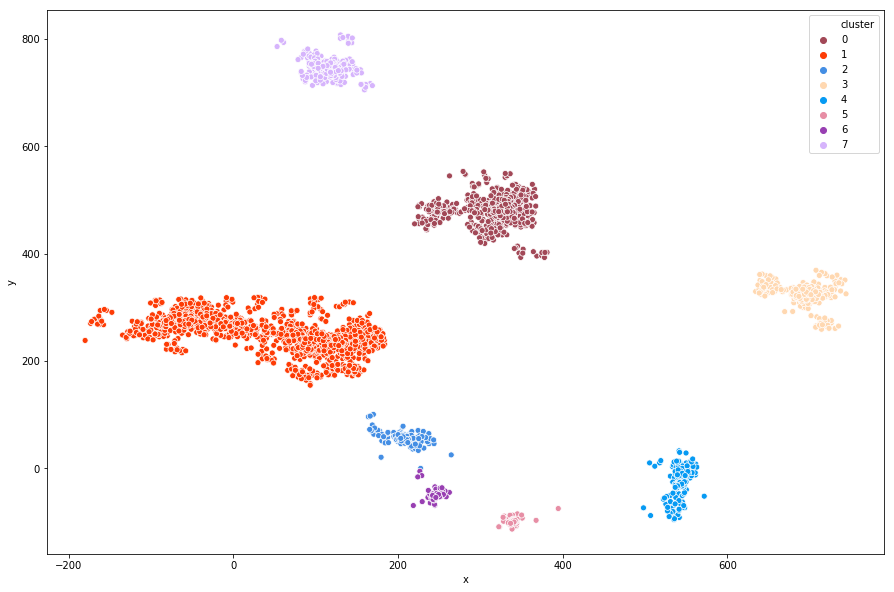

In [26]:
#colors = ["red","blue","green","yellow","pink","black","orange"]
#colors = ["red","blue","green","yellow","pink","black","orange","brown"]
#colors = ["red","blue","green","yellow","pink","black","orange","brown","purple"]
#colors = ["red","blue","green","yellow","pink","black","orange","brown","purple","magenta"]
#colors = ["red","blue","green","yellow","pink","black","orange","brown","purple","magenta","grey","silver"]
colors = random.sample(seaborn_colors,n_clusters)
plt.figure(figsize=(15,10))
#cmap = sns.cubehelix_palette(dark=.3, light=.8, as_cmap=True)
ax = sns.scatterplot(x="x", y="y", data=data_df,hue="cluster",palette=sns.xkcd_palette(colors))

# CONVEX HULL CLUSTER REPRESENTATION

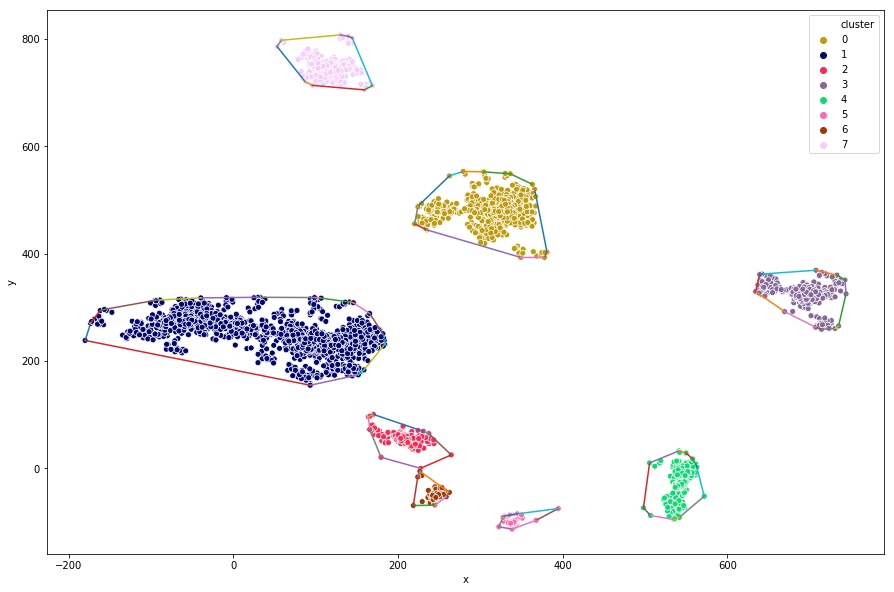

In [27]:
from scipy.spatial import ConvexHull, convex_hull_plot_2d
colors = random.sample(seaborn_colors,n_clusters)
plt.figure(figsize=(15,10))
ax = sns.scatterplot(x="x", y="y", data=data_df,hue="cluster",palette=sns.xkcd_palette(colors))
for c in range(n_clusters):
    p=data_df[data_df["cluster"]==c]
    p=p[['x','y']]
    points = p.values
    hull = ConvexHull(points)
    for simplex in hull.simplices:
        sns.lineplot(points[simplex, 0], points[simplex, 1])

# CELL GENE MARKER

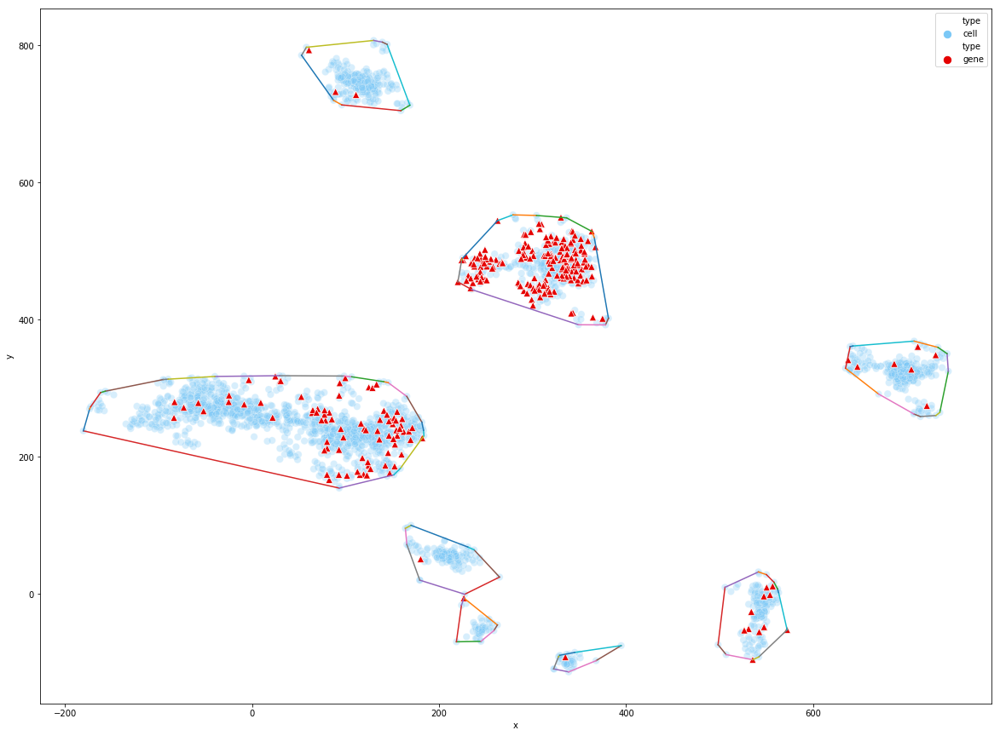

In [28]:
import matplotlib.pyplot as plt, mpld3
from scipy.spatial import ConvexHull, convex_hull_plot_2d
data_df["alpha"] = np.where(data_df['type'] == 'gene', 1.0, 0.5)
color_gene = ["lightblue"]
color_cell = ["red"]
#fig,ax1 = plt.subplots()
plt.figure(figsize=(20,15))

ax = sns.scatterplot(x="x", y="y", data=data_df[data_df['alpha']==0.5],hue="type",palette=sns.xkcd_palette(color_gene),sizes=(70,50),size="type",alpha=0.3)
sns.scatterplot(x="x", y="y", data=data_df[data_df['alpha']==1.0],hue="type",palette=sns.xkcd_palette(color_cell),sizes=(70,50),size="type",marker="^",alpha=1.0,ax=ax)
for c in range(n_clusters):
    p=data_df[data_df["cluster"]==c]
    p=p[['x','y']]
    points = p.values
    hull = ConvexHull(points)
    for simplex in hull.simplices:
        sns.lineplot(points[simplex, 0], points[simplex, 1])

# 3D VISUALISE

In [29]:
import plotly
import plotly.plotly as py
import plotly.offline as pyo
from plotly import graph_objs as go
x_axis = data_df['x']
y_axis = data_df['y']
z_axis = []
#plotly.offline.init_notebook_mode(connected=True)
pyo.init_notebook_mode()
color_map_cell=[]
color_map_gene=[]
size_map_cell=[]
size_map_gene=[]
opacity = []
symbol_cell = []
symbol_gene = []
labels = list(data_df['data'])
for i in range(len(list(data_df.index))):
    if data_df.iloc[i]['type']=='gene':
        z_axis.append(1)
        color_map_gene.append('red')
        size_map_gene.append(10)
        opacity.append(1)
        symbol_gene.append("triangle-up")
    else:
        z_axis.append(-1)
        color_map_cell.append('lightblue')
        size_map_cell.append(5)
        opacity.append(0.5)
        symbol_cell.append("circle")
cell_data = data_df[data_df['type']=='cell']['data']
gene_data = data_df[data_df['type']=='gene']['data']
fig = go.Figure(layout=go.Layout(xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))
fig.add_trace(go.Scatter(x=x_axis, y=y_axis,mode='markers',name='markers',marker_color=color_map_cell,text=cell_data,marker_symbol=symbol_cell,marker_size=size_map_cell,opacity=0.7))
fig.add_trace(go.Scatter(x=x_axis, y=y_axis,mode='markers',name='markers',marker_color=color_map_gene,text=gene_data,marker_symbol=symbol_gene,marker_size=size_map_gene,opacity=1.0))
#fig.show()
pyo.iplot(fig, filename = 'basic-line1')

# GRAPH VISUALIZE

In [30]:
position_dict={}
for d in data:
    temp=[]
    temp.append(float(d[1]))
    temp.append(float(d[2]))
    position_dict[str(d[0])]=np.asarray(temp)

In [31]:
G_normalized = nx.read_gexf("G:/Thesis/Dropclust/Code/output_3k/graph_normalized_own_cc.gexf")
for node in noise:
    G_normalized.remove_node(node) 

In [32]:
nodes = list(G_normalized.nodes())
cell_nodes=[]
gene_nodes=[]
for i in range(0,len(nodes)):
    if nodes[i].isnumeric():
        cell_nodes.append(i)
    else:
        gene_nodes.append(i)

In [33]:
color_map=[]
size_map=[]
shape = []
nodes = list(G_normalized.nodes())
for node in nodes:
    if len(node)==16:
        color_map.append('blue')
        size_map.append(15)
        shape.append("o")
    else:
        color_map.append('red')
        size_map.append(100)
        shape.append("^")

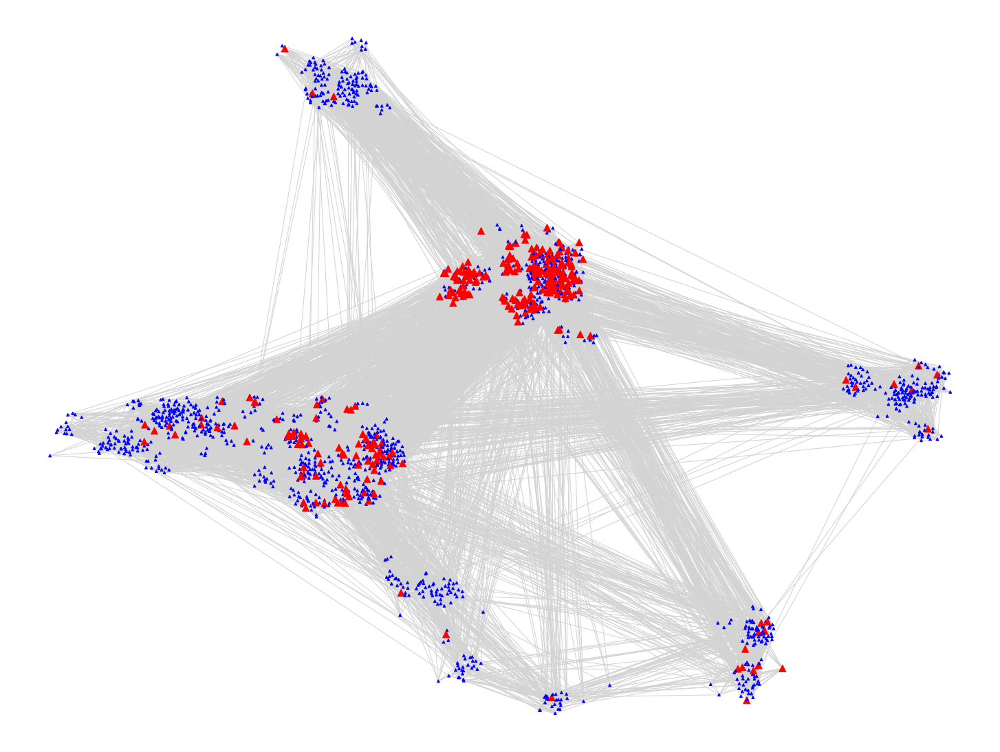

In [34]:
plt.figure(figsize=(20,15))
nx.draw(G_normalized,pos=position_dict,node_color=color_map,node_size=size_map,edge_color='lightgrey',edge_width=0.015,node_shape="^")

# NODE CONNECTION

In [35]:
import plotly
import plotly.plotly as py
import plotly.offline as pyo
from plotly import graph_objs as go
import plotly.offline as pyo
import matplotlib.colors as mcolors
#search_node ="CD37"
search_node = "CD79B"

data_df = pd.read_csv("data.csv",delimiter=",",index_col=False)
data_df.set_index('data',inplace=True)
edge_x = []
edge_y = []
edge_z = []

pyo.init_notebook_mode()
for e in G_normalized.edges():
    if e[0] !=search_node and e[1]!=search_node:
        continue
    edge_x.append(position_dict[e[0]][0])
    edge_x.append(position_dict[e[1]][0])
    edge_x.append(None)
    edge_y.append(position_dict[e[0]][1])
    edge_y.append(position_dict[e[1]][1])
    edge_y.append(None)
    if len(e[0])==16:
        edge_z.append(0.5)
    else:
        edge_z.append(1)
    if len(e[1])==16:
        edge_z.append(0.5)
    else:
        edge_z.append(1)
    edge_z.append(None)

edge_trace = go.Scatter3d(x=edge_x, y=edge_z,z=edge_y,line=dict(width=1, color='black'),hoverinfo='none',mode='lines')

node_x_cell = [] 
node_y_cell = []
node_z_cell = []
node_x_gene = [] 
node_y_gene = []
node_z_gene = []
css_color = mcolors.CSS4_COLORS
css_colors =[]
for key in css_color.keys():
    css_colors.append(key)
color = random.sample(css_colors,n_clusters)
colors = {}
for ind in range(0,len(color)):
    colors[ind] = color[ind]
#colors = {0:"red",1:"blue",2:"green",3:"yellow",4:"pink",5:"black",6:"orange",7:"brown"}
color_map_cell=[]
color_map_gene = []
opacity_cell=[]
opacity_gene = []
cell_name = []
gene_name = []
for node in G_normalized.nodes():
    if len(node)==16:
        cell_name.append(node)
        node_x_cell.append(position_dict[node][0])
        node_y_cell.append(position_dict[node][1])
        color_map_cell.append(colors[data_df.loc[node]['cluster']])
        node_z_cell.append(0.5)
        opacity_cell.append(0.4)
    else:
        gene_name.append(node)
        node_x_gene.append(position_dict[node][0])
        node_y_gene.append(position_dict[node][1])
        color_map_gene.append(colors[data_df.loc[node]['cluster']])
        node_z_gene.append(1)
        opacity_gene.append(0.8)

cell_node_trace = go.Scatter3d(x=node_x_cell, y=node_z_cell,z=node_y_cell,mode='markers',hoverinfo='text',marker=dict(showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        #colorscale='YlGnBu',
        #reversescale=True,
        color=color_map_cell,
        size=10,
        line_width=2))

gene_node_trace = go.Scatter3d(x=node_x_gene, y=node_z_gene,z=node_y_gene,mode='markers',hoverinfo='text',marker=dict(showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        #colorscale='YlGnBu',
        #reversescale=True,
        color=color_map_gene,
        size=10,
        line_width=2,symbol="diamond"))

cell_node_trace.text = cell_name
gene_node_trace.text = gene_name
fig = go.Figure(data=[edge_trace, cell_node_trace,gene_node_trace],
             layout=go.Layout(
                showlegend=False,
                hovermode='closest',
                 height=1000,
                 width=1000,
                margin=dict(b=20,l=5,r=5,t=40),
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                #zaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))
pyo.iplot(fig, filename = 'network')

# INTERACTIVE NETWORK GRAPH

In [36]:
import plotly
import plotly.plotly as py
import plotly.offline as pyo
from plotly import graph_objs as go
import plotly.offline as pyo
edge_x = []
edge_y = []
edge_z = []

pyo.init_notebook_mode()
for e in G_normalized.edges():
    edge_x.append(position_dict[e[0]][0])
    edge_x.append(position_dict[e[1]][0])
    edge_x.append(None)
    edge_y.append(position_dict[e[0]][1])
    edge_y.append(position_dict[e[1]][1])
    edge_y.append(None)
    if len(e[0])==16:
        #print("here")
        edge_z.append(0.5)
    else:
        edge_z.append(1)
    if len(e[1])==16:
        #print("here1")
        edge_z.append(0.5)
    else:
        edge_z.append(1)
    edge_z.append(None)

edge_trace = go.Scatter3d(x=edge_x, y=edge_z,z=edge_y,line=dict(width=0.5, color='#888'),hoverinfo='none',mode='lines')

node_x_cell = [] 
node_y_cell = []
node_z_cell = []
node_x_gene = [] 
node_y_gene = []
node_z_gene = []
color_map_cell = []
color_map_gene = []
cell_name=[]
gene_name=[]
for node in G_normalized.nodes():
    if len(node)==16:
        cell_name.append(node)
        node_x_cell.append(position_dict[node][0])
        node_y_cell.append(position_dict[node][1])
        node_z_cell.append(0.5)
        color_map_cell.append("blue")
    else:
        gene_name.append(node)
        node_x_gene.append(position_dict[node][0])
        node_y_gene.append(position_dict[node][1])
        node_z_gene.append(1)
        color_map_gene.append("red")

cell_node_trace = go.Scatter3d(x=node_x_cell, y=node_z_cell,z=node_y_cell,mode='markers',hoverinfo='text',marker=dict(showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        #colorscale='YlGnBu',
        #reversescale=True,
        color=color_map_cell,
        size=10,
        line_width=2))

gene_node_trace = go.Scatter3d(x=node_x_gene, y=node_z_gene,z=node_y_gene,mode='markers',hoverinfo='text',marker=dict(showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        #colorscale='YlGnBu',
        #reversescale=True,
        color=color_map_gene,
        size=10,                                                                                                                   
        line_width=2),marker_symbol="diamond")

cell_node_trace.text = cell_name
gene_node_trace.text = gene_name
fig = go.Figure(data=[edge_trace, cell_node_trace,gene_node_trace],
             layout=go.Layout(
                showlegend=False,
                hovermode='closest',
                 height=1000,
                 width=1000,
                margin=dict(b=20,l=5,r=5,t=40),
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                #zaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))
pyo.iplot(fig, filename = 'network')

# cells attached clusterwise for input gene

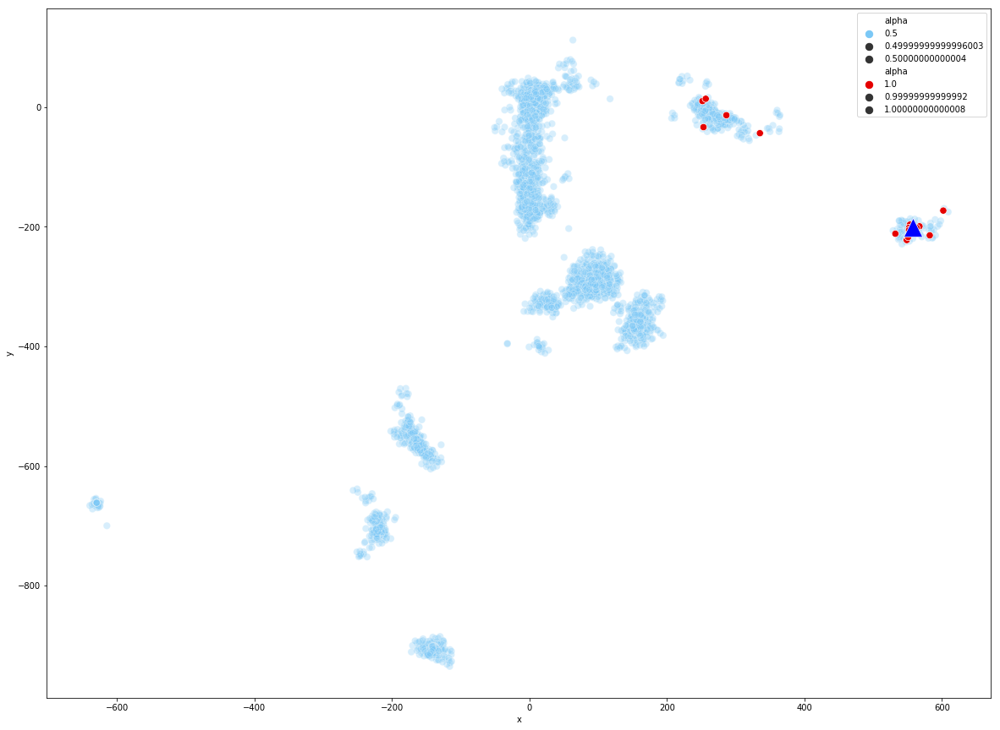

In [49]:
#earch_gene = "GAPDH"
#search_gene = "TXNIP"
#search_gene = "LGALS2"
#earch_gene = "CD79A"
#search_gene = "CD79B"
##############MARKER GENES ########
search_gene = "GNLY"
#search_gene = "S100A8"
nodes = G_normalized.nodes()
cells = []
for e in G_normalized.edges():
    if e[0]==search_gene and len(e[1]) ==16:
        cells.append(e[1])
    elif e[1]==search_gene and(len(e[0]))==16:
        cells.append(e[0])
        
import matplotlib.pyplot as plt, mpld3
from scipy.spatial import ConvexHull, convex_hull_plot_2d
data_df = pd.read_csv("data.csv",delimiter=",",index_col=False)
cell_gene_df = data_df
data = cell_gene_df["data"]
alpha=[]
for d in data:
    if d in cells:
        alpha.append(1)
    else:
        alpha.append(0.5)
cell_gene_df["alpha"] = alpha
color_cells = ["lightblue"]
color_rest = ["red"]
#fig,ax1 = plt.subplots()
plt.figure(figsize=(20,15))

ax = sns.scatterplot(x="x", y="y", data=cell_gene_df[cell_gene_df['alpha']==0.5],hue="alpha",palette=sns.xkcd_palette(color_cells),sizes=(70,50),size="alpha",alpha=0.3)
sns.scatterplot(x="x", y="y", data=cell_gene_df[cell_gene_df['alpha']==1.0],hue="alpha",palette=sns.xkcd_palette(color_rest),sizes=(70,50),size="alpha",alpha=1.0,ax=ax)
sns.scatterplot(x="x",y="y",data = cell_gene_df[cell_gene_df['data']==search_gene],s=500,color="blue",marker="^")
#for c in range(8):
#    p=data_df[data_df["cluster"]==c]
#    p=p[['x','y']]
#    points = p.values
#    hull = ConvexHull(points)
#    for simplex in hull.simplices:
#        sns.lineplot(points[simplex, 0], points[simplex, 1])

In [38]:
import scanpy as sc
sc.settings.verbosity = 2
np.set_printoptions(precision=2)
adata = sc.read_10x_mtx(
'G:/Thesis/Dropclust/dataset/filtered_gene_bc_matrices/hg19/',  # the directory with the `.mtx` file
var_names='gene_symbols',                  # use gene symbols for the variable names (variables-axis index)
cache=True) 
sc.pp.log1p(adata)
orig_data_df = adata.to_df()
read_data_df = adata.to_df()
column_names = data_df.columns

C:\Users\Swagatam\Anaconda3\lib\site-packages\anndata\core\anndata.py:17: FutureWarning:

pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.



... reading from cache file cache\G-Thesis-Dropclust-dataset-filtered_gene_bc_matrices-hg19-matrix.h5ad


... reading from cache file cache\G-Thesis-Dropclust-dataset-filtered_gene_bc_matrices-hg19-matrix.h5ad


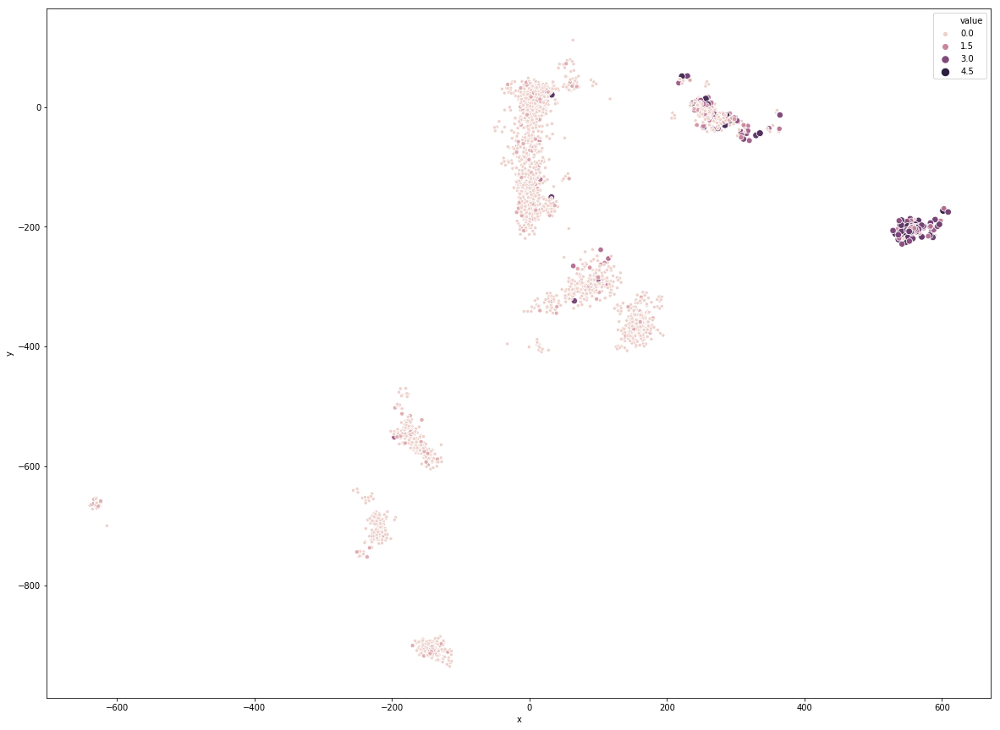

In [50]:
adata = sc.read_10x_mtx(
'G:/Thesis/Dropclust/dataset/filtered_gene_bc_matrices/hg19/',  # the directory with the `.mtx` file
var_names='gene_symbols',                  # use gene symbols for the variable names (variables-axis index)
cache=True) 
#earch_gene = "GAPDH"
#search_gene = "TXNIP"
#search_gene = "LGALS2"
#search_gene = "CD79A"
#search_gene = "CD79B"
####marker genes###########
#search_gene = "PF4"
search_gene = "GNLY"
#search_gene = "S100A8"
nodes = G_normalized.nodes()
cells = []
for e in G_normalized.edges():
    if e[0]==search_gene and len(e[1]) ==16:
        cells.append(e[1])
    elif e[1]==search_gene and(len(e[0]))==16:
        cells.append(e[0])
        
import matplotlib.pyplot as plt, mpld3
from scipy.spatial import ConvexHull, convex_hull_plot_2d
data_df = pd.read_csv("data.csv",delimiter=",",index_col=False)
cell_gene_df = data_df
cell_data = list(cell_gene_df[cell_gene_df["type"]=='cell']['data'])
value_1 = []
value_2 = []
x_val_1 =[]
x_val_2 = []
y_val_1 = []
y_val_2 = []
cell_2 = []
for d in cell_data:
    
    x_val_1.append(cell_gene_df[cell_gene_df['data']==d]['x'])
    y_val_1.append(cell_gene_df[cell_gene_df['data']==d]['y'])
    value_1.append(orig_data_df.loc[d][search_gene])
    #if d in cells:
    #    x_val_1.append(cell_gene_df[cell_gene_df['data']==d]['x'])
    #    y_val_1.append(cell_gene_df[cell_gene_df['data']==d]['y'])
    #    value_1.append(orig_data_df.loc[d][search_gene])
    #    #print(orig_data_df.loc[d][search_gene])
    #else:
    #    cell_2.append(d)
    #    x_val_2.append(cell_gene_df[cell_gene_df['data']==d]['x'])
    #    y_val_2.append(cell_gene_df[cell_gene_df['data']==d]['y'])
    #    value_2.append(0)

plt.figure(figsize=(20,15))
final_data_1 = pd.DataFrame();
final_data_2 = pd.DataFrame();
final_data_1['x'] = x_val_1
final_data_1['y'] = y_val_1
final_data_1['value'] = value_1
final_data_1['data'] = cell_data
final_data_2['x'] = x_val_2
final_data_2['y'] = y_val_2
final_data_2['value'] = value_2
final_data_2['data'] = cell_2

#ax = sns.scatterplot(x="x", y="y", data=final_data_2,hue="value",alpha=0.5)
ax = sns.scatterplot(x="x", y="y", data=final_data_1,hue="value",alpha=1.0,size="value")

#sns.scatterplot(x="x", y="y", data=final_data[final_data['value']!=0],hue="value",alpha=1.0,ax=ax)
#sns.scatterplot(x="x", y="y", data=cell_gene_df[cell_gene_df['alpha']==1.0],hue="alpha",palette=sns.xkcd_palette(color_rest),sizes=(70,50),size="alpha",ax=ax)
#sns.scatterplot(x="x",y="y",data = cell_gene_df[cell_gene_df['data']==search_gene],s=500,color="blue",marker="^")
#for c in range(8):
#    p=data_df[data_df["cluster"]==c]
#    p=p[['x','y']]
#    points = p.values
#    hull = ConvexHull(points)
#    for simplex in hull.simplices:
#        sns.lineplot(points[simplex, 0], points[simplex, 1])

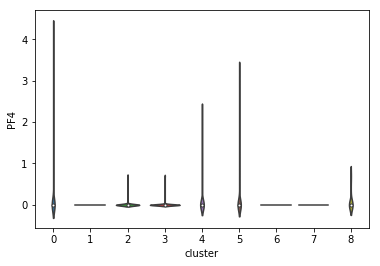

In [53]:
#search_gene = "S100A8"
#search_gene = "PF4"
#search_gene = "GNLY"
import matplotlib.pyplot as plt, mpld3
data_df = pd.read_csv("data.csv",delimiter=",",index_col=False)
info_data_df = data_df
info_data_df.set_index('data',inplace=True)
pca_df = pd.read_csv("pca_genes_df.csv",delimiter=",",index_col=False)
pca_df.set_index('Unnamed: 0',inplace=True)
cells_data = pca_df.loc[:,search_gene]
format_df = cells_data.to_frame()
cells = format_df.index
cluster = []
for cell in cells:
    if cell in info_data_df.index :
        cluster.append(info_data_df.loc[cell]['cluster'])
    else:
        format_df=format_df.drop(cell)
format_df['cluster'] = cluster
sx = sns.violinplot(x="cluster",y=search_gene,data=format_df)

<Figure size 1440x1080 with 0 Axes>

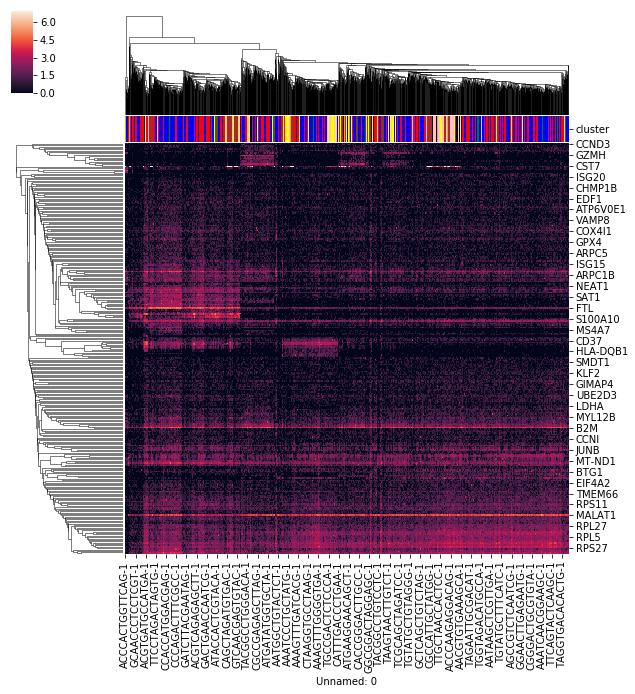

In [43]:
heat_map_df = pd.read_csv("G:/Thesis/Dropclust/Code/output_3k/pca_genes_df.csv",delimiter=",",index_col=False)
heat_map_df.fillna(0)
data_df = pd.read_csv("data.csv",delimiter=",",index_col=False)
data_df.set_index('data',inplace=True)
data_df.drop('Unnamed: 0',axis=1,inplace=True)
cells = list(data_df.index)
heat_map_df = pd.read_csv("pca_genes_df.csv",delimiter=",",index_col=False)
heat_map_df.set_index('Unnamed: 0',inplace=True)
cluster=[]
for ind in range(len(list(heat_map_df.index))):
    if data_df.iloc[ind]['cluster']==-1:
        heat_map_df.drop(ind,inplace=True)
    else:
        cluster.append(data_df.iloc[ind]['cluster'])
heat_map_df['cluster'] = cluster
colors = {0:"red",1:"blue",2:"green",3:"yellow",4:"pink",5:"black",6:"orange",7:"brown"}
map_colors = heat_map_df.cluster.map(colors)
heat_map_df=heat_map_df.transpose()
#heat_map_df.columns = heat_map_df.iloc[0]
#heat_map_df =heat_map_df[1:]
heat_map_df = heat_map_df[heat_map_df.columns].astype(float)
#heat_map_df = heat_map_df[heat_map_df.columns].astype(float)
#map_colors = heat_map_df.cluster.map(colors)
plt.figure(figsize=(20,15))
sns.clustermap(heat_map_df,metric="correlation",col_colors=map_colors)

In [46]:
heat_map_df = pd.read_csv("G:/Thesis/Dropclust/Code/output_3k/pca_genes_df.csv",delimiter=",",index_col=False)
heat_map_df.fillna(0)
data_df = pd.read_csv("data.csv",delimiter=",",index_col=False)
data_df.set_index('data',inplace=True)
data_df.drop('Unnamed: 0',axis=1,inplace=True)
cells = list(data_df.index)
heat_map_df = pd.read_csv("pca_genes_df.csv",delimiter=",",index_col=False)
heat_map_df.set_index('Unnamed: 0',inplace=True)
cluster=[]
for ind in range(len(list(heat_map_df.index))):
    if data_df.iloc[ind]['cluster']==-1:
        heat_map_df.drop(ind,inplace=True)
    else:
        cluster.append(data_df.iloc[ind]['cluster'])
heat_map_df['cluster'] = cluster
heat_map_df = heat_map_df.sort_values('cluster')
colors = {0:"red",1:"blue",2:"green",3:"yellow",4:"pink",5:"black",6:"orange",7:"brown"}
map_colors = heat_map_df.cluster.map(colors)
heat_map_df=heat_map_df.transpose()
heat_map_df = heat_map_df[heat_map_df.columns].astype(float)
cluster=[]
for ind in range(len(list(heat_map_df.index))):
    if data_df.iloc[ind]['cluster']==-1:
        heat_map_df.drop(ind,inplace=True)
    else:
        cluster.append(data_df.iloc[ind]['cluster'])
heat_map_df['cluster'] = cluster
heat_map_df = heat_map_df.sort_values('cluster')
row_colors = heat_map_df.cluster.map(colors)
plt.figure(figsize=(6,7))
sns.clustermap(heat_map_df,col_colors=map_colors,row_colors=row_colors,metric="correlation")

KeyError: 'Passing list-likes to .loc or [] with any missing labels is no longer supported, see https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike'

<Figure size 432x504 with 0 Axes>

<Figure size 720x720 with 0 Axes>

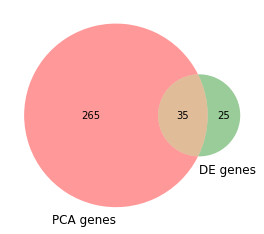

In [44]:
from matplotlib_venn import venn2, venn2_circles
#figure, axes = plt.subplots(2, 2)
pca_df = pd.read_csv("pca_genes_df.csv",delimiter=",",index_col=False)
pca_df.set_index('Unnamed: 0',inplace=True)
pca_genes = list(pca_df.columns)
DE_genes = ['LST1','RP11-290F20.3','IFITM3','MS4A7','AIF1','HES4','SERPINA1','COTL1',
            'PILRA','SPI1','GZMB','PRF1','FGFBP2','GZMA','GNLY','CST7','CTSW','SPON2','NKG7','CD247',
            'CD79A','MS4A1','LINC00926','CD79B','VPREB3','HLA-DQB1','TCL1A','CD74','HLA-DQA1','HLA-DRA',
            'S100A8','LGALS2','S100A9','CD14','MS4A6A','LYZ','FCN1','TYROBP','CST3','GPX1',
            'CD3D','IL32','IL7R','CD3E','RPS25','RPS12','CD2','LDHB','CD3G','RPS29',
            'ITGA2B','SPARC','GP9','CLU','GNG11','PF4','CD9','TREML1','TMEM40','SDPR'
           ]
venn2([set(pca_genes),set(DE_genes)], ('PCA genes', 'DE genes'))
plt.show()